# Preparation #

### Library

In [1]:
#library

# Pandas
import pandas as pd
import numpy as np

# Graph
import community
import networkx as nx 

# Plot
import matplotlib.pyplot as plt
import seaborn as sns

# Combinations
import itertools

import operator

### Data Preprocessing

In [4]:
# Load data
n_sf = pd.read_csv("C:\\Users\\nodes.csv")
e_sf = pd.read_csv("C:\\Users\\hero-network.csv")

# Data preprocessing
n_sf.head()
e_sf.head()

n_sf.info
e_sf.info

# find unique items of hero1 and hero2 in e_sf
hero1 = e_sf.drop_duplicates(['hero1'])
hero2 = e_sf.drop_duplicates(['hero2'])

hero1.shape # 6211
hero2.shape # 6173

# whether there is a hero that not in "node" list of n_sf
hero1.hero1.isin(n_sf.node).sum() # 6069
hero2.hero2.isin(n_sf.node).sum() # 6034

# so a few hero are not in "node" list, need to add them into "node" list
a = hero1[hero1.hero1.isin(n_sf.node)==False]
b = hero2[hero2.hero2.isin(n_sf.node)==False]
a.columns=['c1','c2']
b.columns=['c2','c1']

add_df1 = pd.concat([a,b])
add_df1 = add_df1.drop_duplicates(['c1'])
add_df1['type']='hero'

add_df = add_df1[['c1','type']]
add_df.columns = ['node','type']
add_df = add_df.reset_index(drop=True)

C:\Users\Mikayla\Anaconda3\lib\site-packages\ipykernel_launcher.py:29: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



### Original Graph

In [5]:
g = nx.Graph() # Creating Undirected Graph

# adding each node and edge one after the other
for n in n_sf['node']:
    g.add_node(n)
    
for r in range(e_sf.shape[0]):
    g.add_edge(e_sf.iloc[r]['hero1'], e_sf.iloc[r]['hero2'])

### Vertices Filtering

There are 711 superheroes connected to Black Panter
Name: 
Type: Graph
Number of nodes: 6373
Number of edges: 167167
Average degree:  52.4610


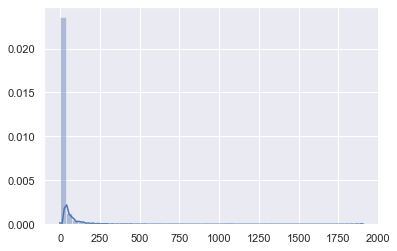

In [6]:
d = g.degree()
list(dict(d).items())[:20]

print("There are %s superheroes connected to Black Panter"  %
      d["BLACK PANTHER/T'CHAL"])    
    

max(dict(d).items(), key=operator.itemgetter(1))


sns.set()
sns.distplot([v for v in dict(d).values()])    


# let's create a list with nodes that have degree > 1
selected_nodes_list = [n for n,d in dict(d).items() if d > 1]
# create a subgraph with only nodes from the above list
h = g.subgraph(selected_nodes_list)
print(nx.info(h))  

# Community Detection

### Greedy Modularity Community

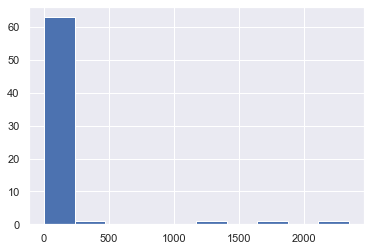

In [8]:
from networkx.algorithms.community import greedy_modularity_communities
cc = greedy_modularity_communities(h) # 计算出来的community
len(cc)  # 查看一共有多少个community  

#查看每个community中节点的数量
community_size_list = [len(c) for c in cc]
plt.hist(community_size_list)

# 将community中的数据变成字典的形式
cc_dic = {}

for i in range(len(cc)):
    list_cc = list(cc[i])
    list_class = [i]*len(cc[i])
    dict_inter = dict(zip(list_cc,list_class))
    cc_dic.update(dict_inter) # 生成的字典

In [9]:
# 将nodes数量在100到500之间的community找出来
selected_community_list = [c for c in cc if 500 > len(c) > 100]
len(selected_community_list) # 一共有两个

2

C:\Users\Mikayla\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


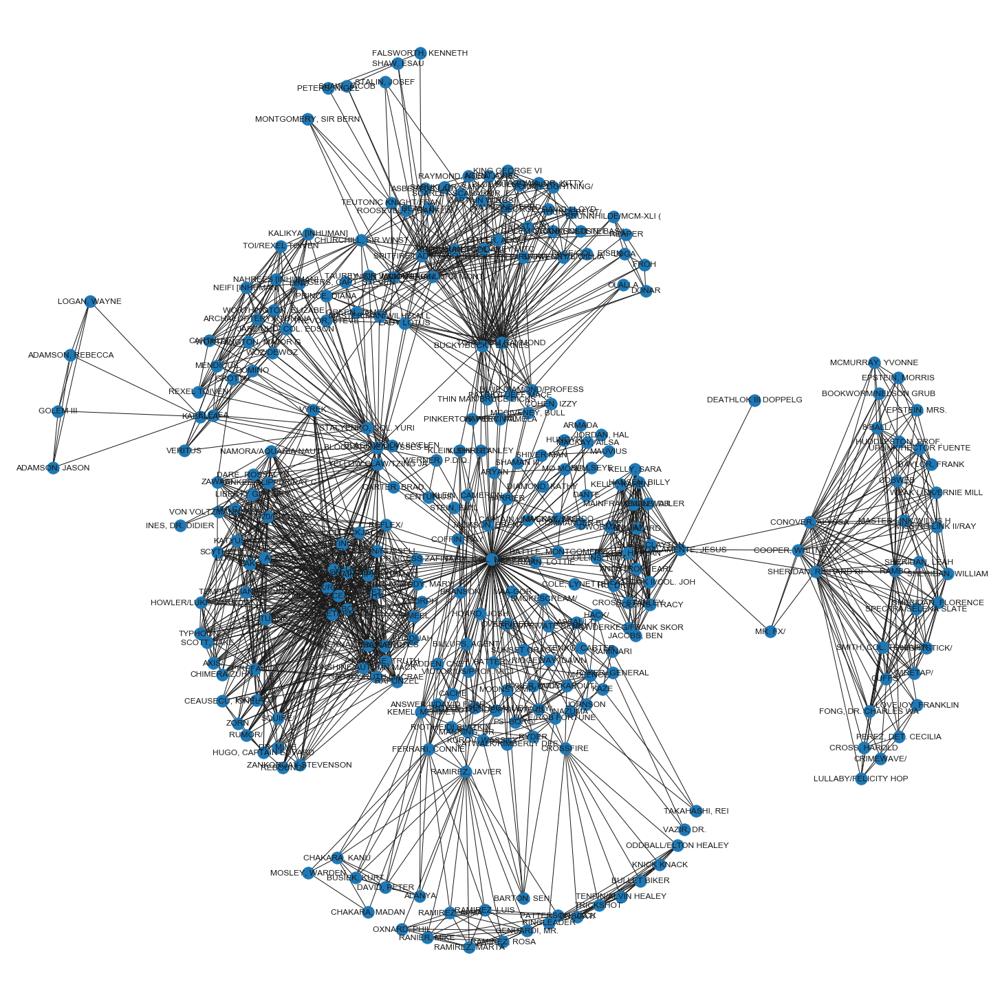

In [10]:
# 画出这两个community的图像
plt.figure(figsize=(20,20))
c1 = h.subgraph(selected_community_list[0])
nx.draw_kamada_kawai(c1, with_labels=True)

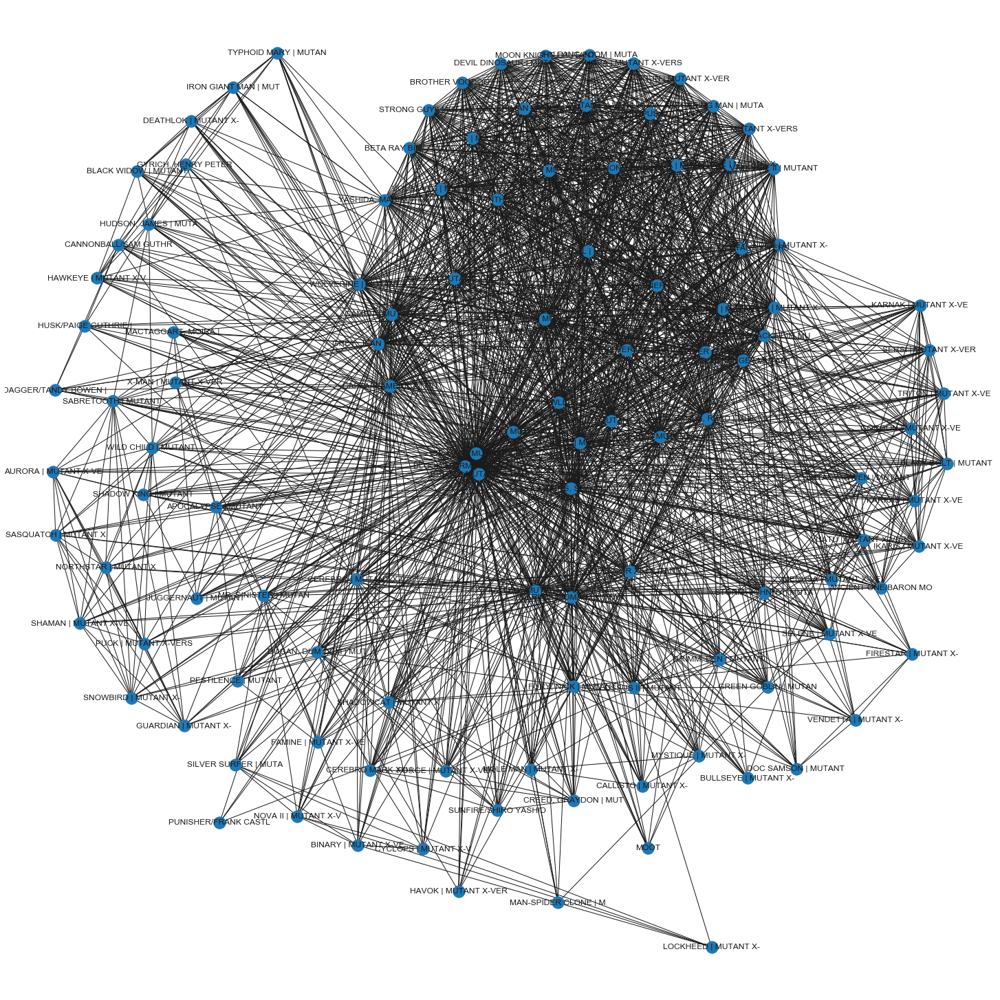

In [11]:
plt.figure(figsize=(20,20))
c2 = h.subgraph(selected_community_list[1])
nx.draw_kamada_kawai(c2, with_labels=True)

### Label Propagation Community

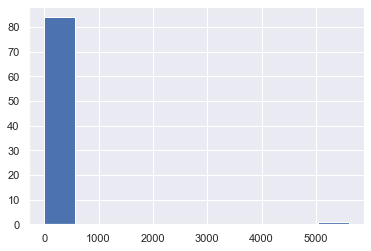

In [17]:
from networkx.algorithms.community.label_propagation import label_propagation_communities
cc2 = list(label_propagation_communities(h))
cc2
len(cc2) # 一共有多少个community

# community中节点数量
import matplotlib.pyplot as plt
community_size_list2 = [len(c) for c in cc2]

community_size_list2
plt.hist(community_size_list2)

# 将community中的数据变成字典的形式
cc2_dic = {}

for i in range(len(cc2)):
    list_cc2 = list(cc2[i])
    list_class = [i]*len(cc2[i])
    dict_inter = dict(zip(list_cc2,list_class))
    cc2_dic.update(dict_inter) # 生成的字典

In [18]:
# 找到节点数在30到300的communities
selected_community_list2 = [c for c in cc2 if 300>len(c) > 30]
len(selected_community_list2) 

5

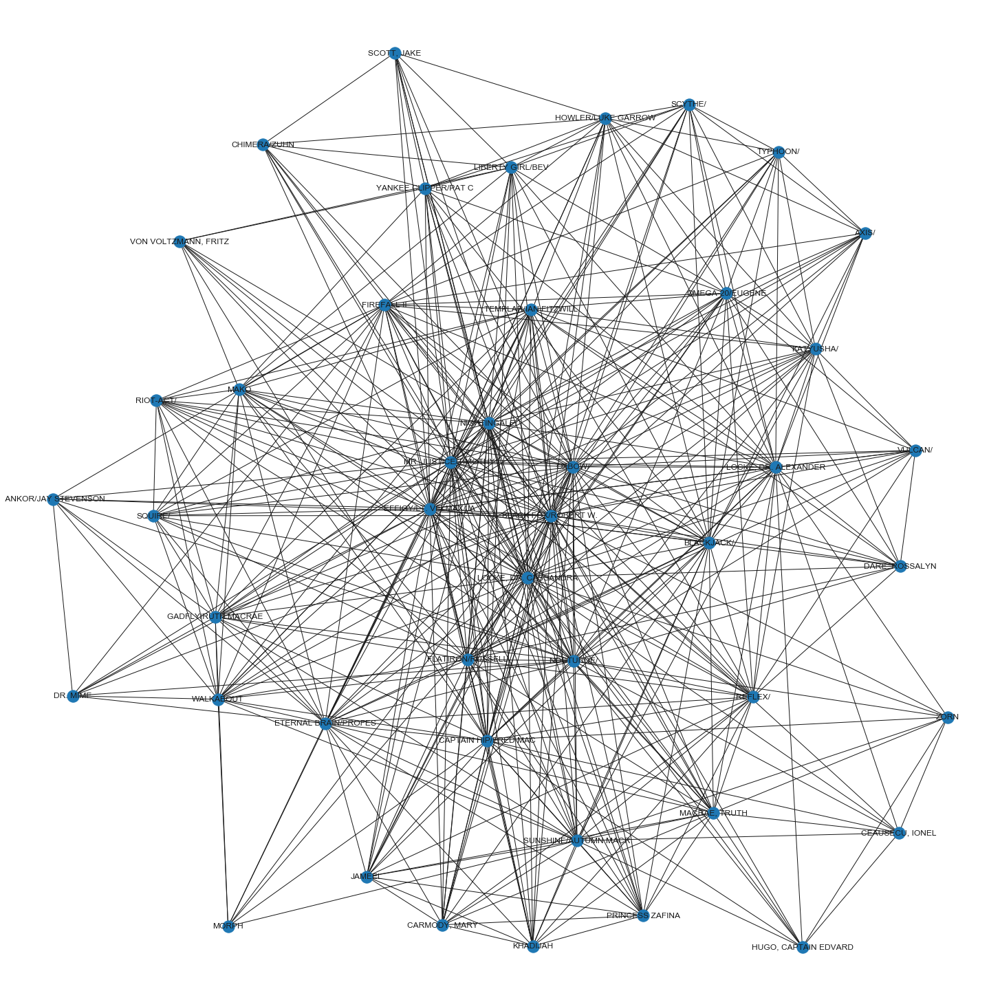

In [19]:
plt.figure(figsize=(20,20))
c1 = h.subgraph(selected_community_list2[0])
nx.draw_kamada_kawai(c1, with_labels=True)

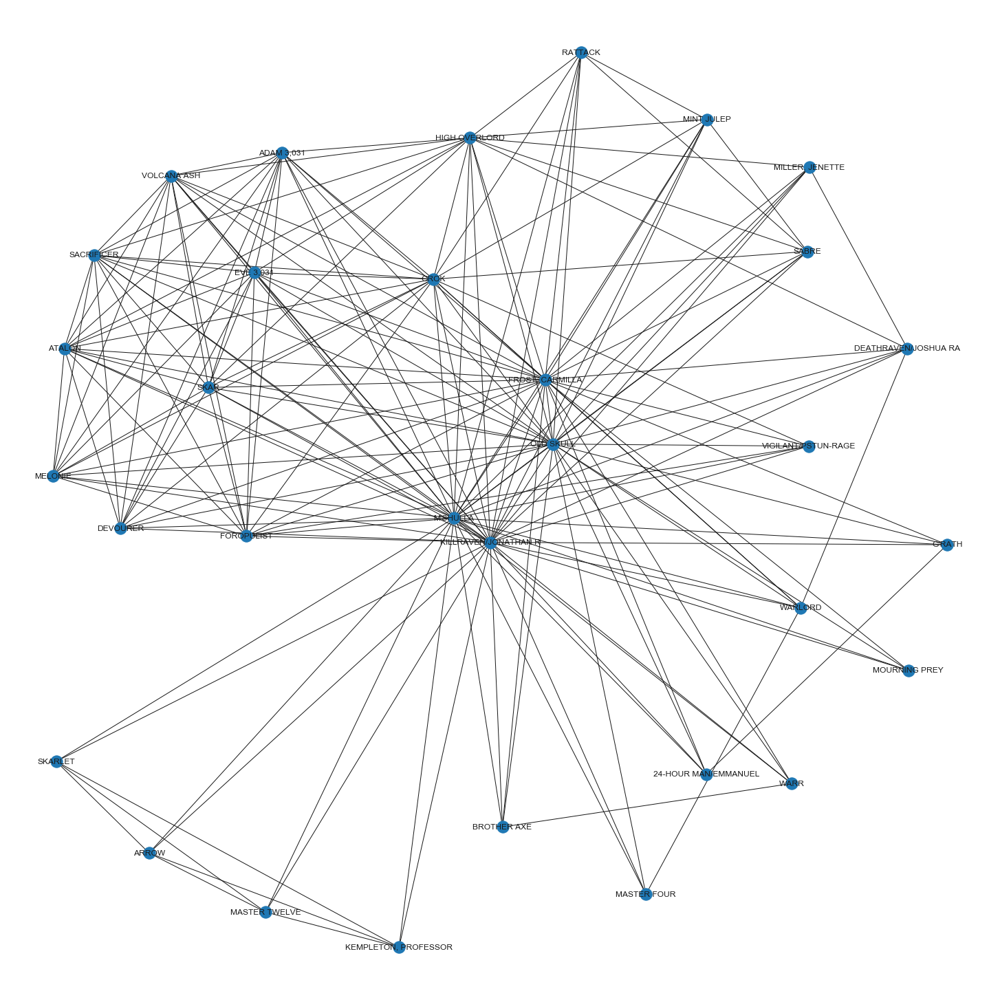

In [20]:
plt.figure(figsize=(20,20))
c2 = h.subgraph(selected_community_list2[1])
nx.draw_kamada_kawai(c2, with_labels=True)

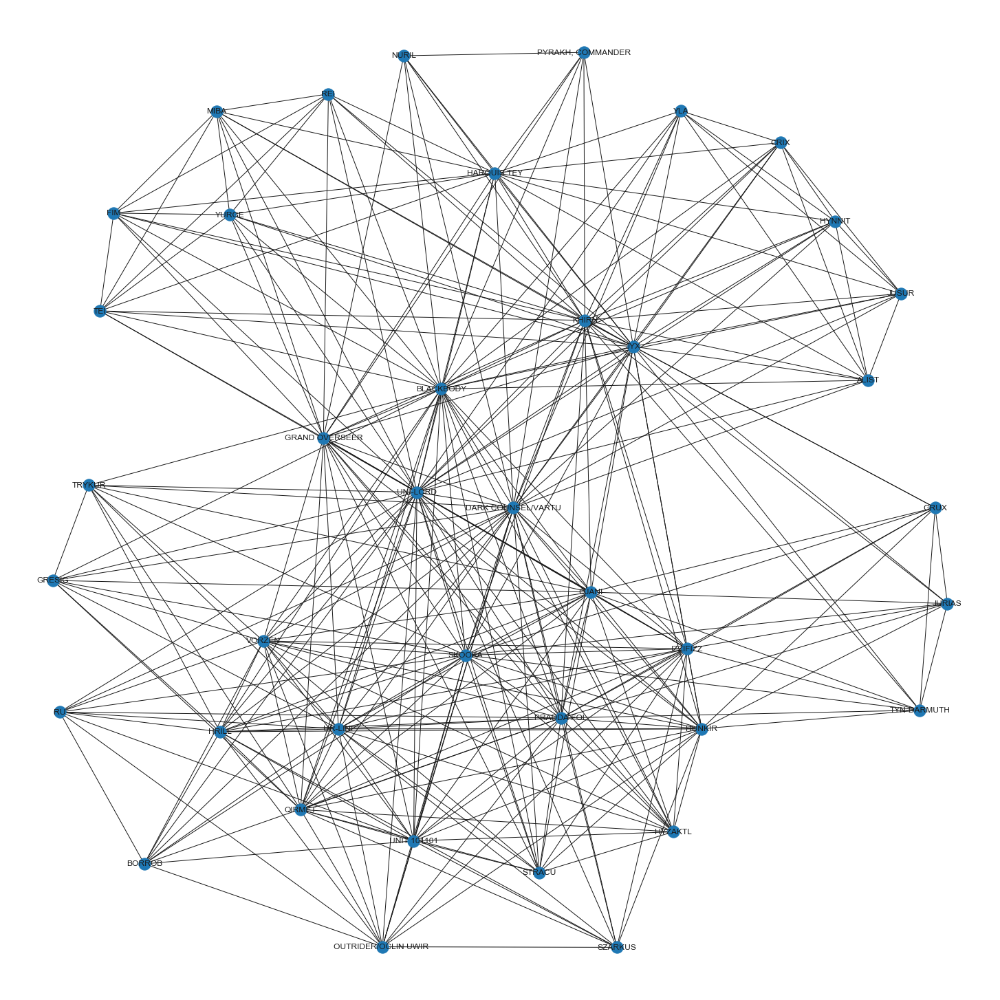

In [21]:
plt.figure(figsize=(20,20))
c3 = h.subgraph(selected_community_list2[2])
nx.draw_kamada_kawai(c3, with_labels=True)

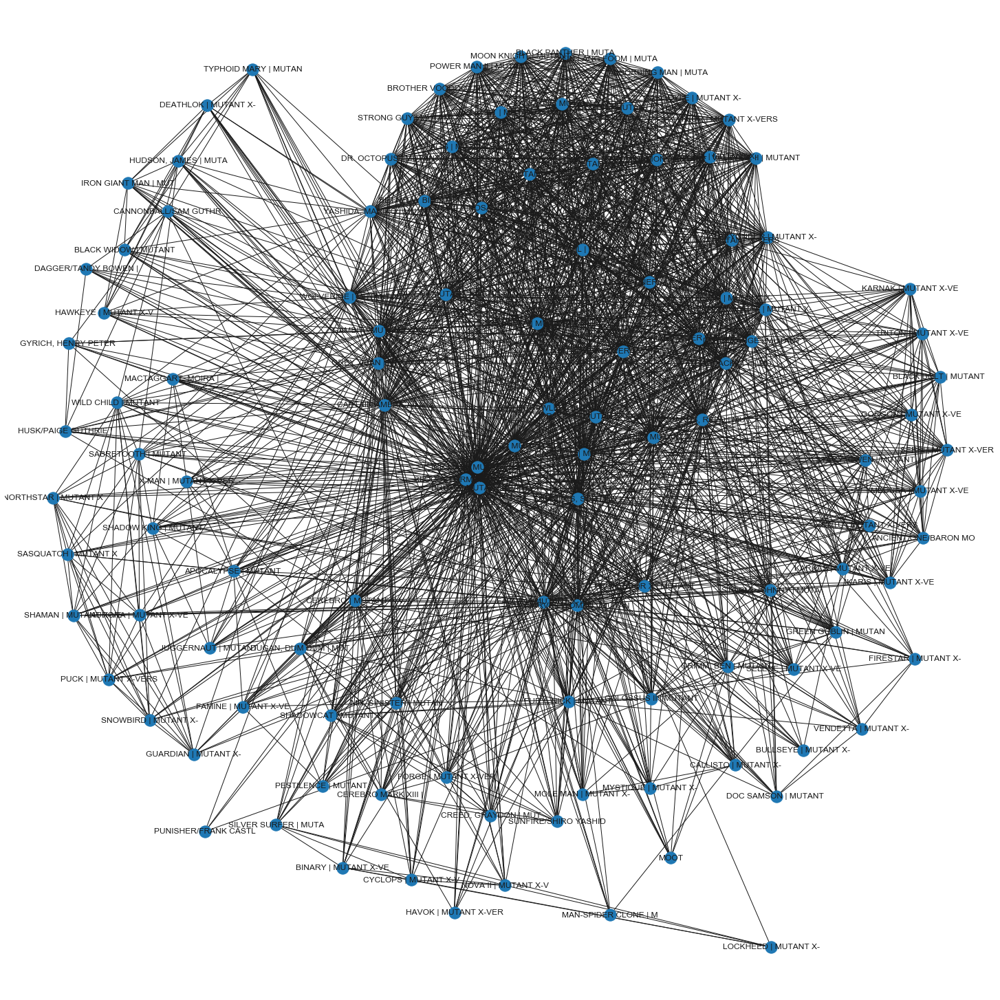

In [22]:
plt.figure(figsize=(20,20))
c4 = h.subgraph(selected_community_list2[3])
nx.draw_kamada_kawai(c4, with_labels=True)

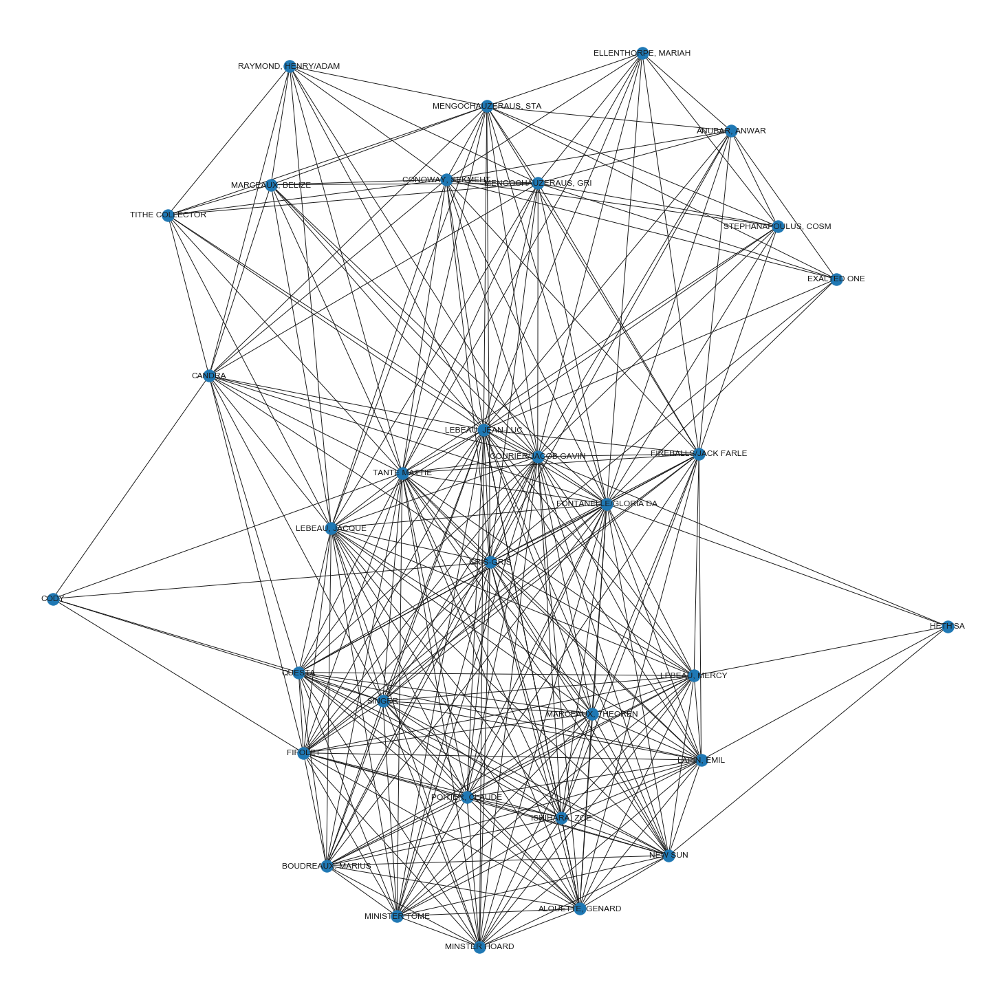

In [23]:
plt.figure(figsize=(20,20))
c5 = h.subgraph(selected_community_list2[4])
nx.draw_kamada_kawai(c5, with_labels=True)

# Find Key Player

### For Greedy Modularity Community

In [24]:
#According to Degree Centrality who is the most centeral hero:
for i in range(len(selected_community_list)):
    c=h.subgraph(selected_community_list[i])
    d = nx.degree_centrality(c)
    key_player = max(dict(d).items(), key=operator.itemgetter(1)) 
    print('-----------------------------------------------------')
    print('the No. of the community: ',i+1)
    print('key player:',key_player)

-----------------------------------------------------
the No. of the community:  1
key player: ('FURY, COL. NICHOLAS ', 0.43727598566308246)
-----------------------------------------------------
the No. of the community:  2
key player: ('BRUTE | MUTANT X-VER', 0.9914529914529916)


In [28]:
#According to Closeness Centrality who is the most centeral hero:
for i in range(len(selected_community_list)):
    c=h.subgraph(selected_community_list[i])
    d = nx.closeness_centrality(c)
    key_player = max(dict(d).items(), key=operator.itemgetter(1)) 
    print('-----------------------------------------------------')
    print('the No. of the community: ',i+1)
    print('key player:',key_player)

-----------------------------------------------------
the No. of the community:  1
key player: ('FURY, COL. NICHOLAS ', 0.5898520084566596)
-----------------------------------------------------
the No. of the community:  2
key player: ('BRUTE | MUTANT X-VER', 0.9915254237288136)


In [25]:
#According to PageRank who is the most centeral hero:
for i in range(len(selected_community_list)):
    c=h.subgraph(selected_community_list[i])
    d = nx.pagerank(c)
    key_player = max(dict(d).items(), key=operator.itemgetter(1)) 
    print('-----------------------------------------------------')
    print('the No. of the community: ',i+1)
    print('key player:',key_player)

-----------------------------------------------------
the No. of the community:  1
key player: ('FURY, COL. NICHOLAS ', 0.04476212954041454)
-----------------------------------------------------
the No. of the community:  2
key player: ('BRUTE | MUTANT X-VER', 0.026958083477295777)


### For Label Propagation Community

In [26]:
#According to Degree Centrality who is the most centeral hero:
for i in range(len(selected_community_list2)):
    c=h.subgraph(selected_community_list2[i])
    d = nx.degree_centrality(c)
    key_player = max(dict(d).items(), key=operator.itemgetter(1)) 
    print('-----------------------------------------------------')
    print('the No. of the community: ',i+1)
    print('key player:',key_player)

-----------------------------------------------------
the No. of the community:  1
key player: ('BLACK FOX/ROBERT W. ', 0.9772727272727273)
-----------------------------------------------------
the No. of the community:  2
key player: ("M'SHULLA", 1.0)
-----------------------------------------------------
the No. of the community:  3
key player: ('UNI-LORD', 0.8717948717948718)
-----------------------------------------------------
the No. of the community:  4
key player: ('BRUTE | MUTANT X-VER', 0.9914529914529916)
-----------------------------------------------------
the No. of the community:  5
key player: ('COURIER/JACOB GAVIN', 0.9375)


In [29]:
#According to Closeness Centrality who is the most centeral hero:
for i in range(len(selected_community_list2)):
    c=h.subgraph(selected_community_list2[i])
    d = nx.closeness_centrality(c)
    key_player = max(dict(d).items(), key=operator.itemgetter(1)) 
    print('-----------------------------------------------------')
    print('the No. of the community: ',i+1)
    print('key player:',key_player)

-----------------------------------------------------
the No. of the community:  1
key player: ('BLACK FOX/ROBERT W. ', 0.9777777777777777)
-----------------------------------------------------
the No. of the community:  2
key player: ("M'SHULLA", 1.0)
-----------------------------------------------------
the No. of the community:  3
key player: ('UNI-LORD', 0.8863636363636364)
-----------------------------------------------------
the No. of the community:  4
key player: ('BRUTE | MUTANT X-VER', 0.9915254237288136)
-----------------------------------------------------
the No. of the community:  5
key player: ('COURIER/JACOB GAVIN', 0.9411764705882353)


In [27]:
#According to PageRank who is the most centeral hero:
for i in range(len(selected_community_list2)):
    c=h.subgraph(selected_community_list2[i])
    d = nx.pagerank(c)
    key_player = max(dict(d).items(), key=operator.itemgetter(1)) 
    print('-----------------------------------------------------')
    print('the No. of the community: ',i+1)
    print('key player:',key_player)

-----------------------------------------------------
the No. of the community:  1
key player: ('BLACK FOX/ROBERT W. ', 0.04454856143555449)
-----------------------------------------------------
the No. of the community:  2
key player: ("M'SHULLA", 0.08170797474584836)
-----------------------------------------------------
the No. of the community:  3
key player: ('UNI-LORD', 0.05017076912584609)
-----------------------------------------------------
the No. of the community:  4
key player: ('BRUTE | MUTANT X-VER', 0.026958083477295777)
-----------------------------------------------------
the No. of the community:  5
key player: ('COURIER/JACOB GAVIN', 0.04885645170796945)


# Evaluation

In [31]:
import modularity

### For Greedy Modularity Community

In [32]:
Greedy_modularity = community.modularity(cc_dic, h)
print('The global modularity of greedy modularity community: ',Greedy_modularity)

AttributeError: module 'community' has no attribute 'modularity'

### For Label Propagation Community

In [30]:
LP_modularity = community.modularity(cc2_dic, h)
print('The global modularity of label propagation community: ',LP_modularity)

The global modularity of label propagation community:  0.056376389471366604
